In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import warnings
from sklearn import preprocessing, metrics
from ipywidgets import widgets, interactive
import gc
import joblib
from datetime import datetime, timedelta 
from typing import Union
from tqdm.notebook import tqdm_notebook as tqdm
from itertools import cycle
import datetime as dt
from torch.autograd import Variable
import random 
from matplotlib.pyplot import figure
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler
import time 
from torch.utils.data import Dataset
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from lightgbm import LGBMRegressor
from sklearn.feature_selection import VarianceThreshold
from tsfresh.feature_extraction.settings import from_columns
from tsfresh.feature_selection.relevance import calculate_relevance_table
from tsfresh import select_features, extract_features, extract_relevant_features
from tsfresh.utilities.dataframe_functions import impute
from tqdm import tqdm
import seaborn as sns
import lightgbm as lgb

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)


# load dataset and show the first run
case1run1 = pd.read_csv('./mill_data_final/case1run1.csv')
case1run2 = pd.read_csv('./mill_data_final/case1run2.csv')
columns=['case', 'run', 'VB', 'time', 'doc','feed','material','smcAC', 'smcDC', 'vib_table', 'vib_spindle', 'AE_table', 'AE_spindle']
case1run1.columns = columns
case1run2.columns = columns

FileNotFoundError: [Errno 2] No such file or directory: './mill_data_total/case1run1.csv'

In [100]:
def sliding_windows(data, seq_length,hop_size):
    x = []
    for i in range(int((len(data)-seq_length)/hop_size)):
        _x = data[i*hop_size:i*hop_size+seq_length]
        x.append(_x)
    x=np.array(x)
    return x

In [4]:
def labeling(data,seq_length,hop_size,lab):
    x = []
    for i in range(int((len(data)-seq_length)/hop_size)):
        x.append(lab)

    return np.array(x)

In [6]:
path = './mill_data_final/'
file_list = os.listdir(path)

In [8]:
def to_dataset(data,label):
    smcAC=np.expand_dims(sliding_windows(data['smcAC'][3000:6000],1024,256),axis=2)
    smcDC=np.expand_dims(sliding_windows(data['smcDC'][3000:6000],1024,256),axis=2)
    vib_table=np.expand_dims(sliding_windows(data['vib_table'][3000:6000],1024,256),axis=2)
    vib_spindle=np.expand_dims(sliding_windows(data['vib_spindle'][3000:6000],1024,256),axis=2)
    AE_table=np.expand_dims(sliding_windows(data['AE_table'][3000:6000],1024,256),axis=2)
    AE_spindle=np.expand_dims(sliding_windows(data['AE_spindle'][3000:6000],1024,256),axis=2)
    xdata = np.concatenate((smcAC,smcDC,vib_table,vib_spindle,AE_table,AE_spindle),axis=2)
    ydata = labeling(data[3000:6000],1024,256, label)
    return xdata,ydata

In [9]:
def to_casedataset(data_list):
    empty_x=np.zeros(((1, 1024, 6)))
    empty_y=np.zeros(((1)))

    for i in data_list:
        pdd=pd.read_csv('./mill_data_final/'+i)
        pdd.columns = columns
        lab=pdd['VB'][0]
        if str(lab)!='nan':
            x_,y_=to_dataset(pdd,lab)
            empty_x=np.concatenate((empty_x,x_),axis=0)
            empty_y=np.concatenate((empty_y,y_),axis=0)
            print(i)
    return empty_x[1:],empty_y[1:]

In [10]:
case1list=[file for file in file_list if file.startswith('case1run')]
case9list=[file for file in file_list if file.startswith('case9run')]

In [12]:
c1_x,c1_y=to_casedataset(case1list)

case1run1.csv
case1run10.csv
case1run11.csv
case1run12.csv
case1run13.csv
case1run14.csv
case1run15.csv
case1run2.csv
case1run3.csv
case1run4.csv
case1run5.csv
case1run6.csv
case1run7.csv
case1run8.csv
case1run9.csv


In [17]:
c9_x,c9_y=to_casedataset(case9list)

case9run1.csv
case9run2.csv
case9run3.csv
case9run4.csv
case9run5.csv
case9run6.csv
case9run7.csv
case9run8.csv
case9run9.csv


In [19]:
c1_x_c=pd.DataFrame(c1_x[:,:,0])
c1_x_c['index']=list(range(105))

In [20]:
c1_x_t=pd.melt(c1_x_c,id_vars='index',var_name='time', value_name='value').sort_values(['index','time']).reset_index(drop=True)
c1_x_t_total=c1_x_t

In [21]:
columnt=['smcAC', 'smcDC', 'vib_table', 'vib_spindle', 'AE_table', 'AE_spindle']

In [22]:
for k in range(6):
    c1_x_c=pd.DataFrame(c1_x[:,:,k])
    c1_x_c['index']=list(range(105))
    c1_x_t=pd.melt(c1_x_c,id_vars='index',var_name='time', value_name='value').sort_values(['index','time']).reset_index(drop=True)
    c1_x_t_total[columnt[k]]=c1_x_t['value']
del c1_x_t_total['value']

In [23]:
c9_x_c=pd.DataFrame(c9_x[:,:,0])
c9_x_c['index']=list(range(63))

In [24]:
c9_x_t=pd.melt(c9_x_c,id_vars='index',var_name='time', value_name='value').sort_values(['index','time']).reset_index(drop=True)
c9_x_t_total=c9_x_t


In [25]:
for k in range(6):
    c9_x_c=pd.DataFrame(c9_x[:,:,k])
    c9_x_c['index']=list(range(63))
    c9_x_t_total[columnt[k]]=c9_x_t['value']
    c9_x_t=pd.melt(c9_x_c,id_vars='index',var_name='time', value_name='value').sort_values(['index','time']).reset_index(drop=True)
del c9_x_t_total['value']

In [26]:
c1_x_t_total

,index,time,smcAC,smcDC,vib_table,vib_spindle,AE_table,AE_spindle
0,0,0,-2.375488,7.138672,1.933594,0.603027,0.170898,0.177002
1,0,1,-1.958008,6.953125,2.309570,0.665283,0.144043,0.180664
2,0,2,-1.274414,7.177734,1.972656,0.603027,0.135498,0.171509
3,0,3,-0.830078,7.558594,1.210938,0.440674,0.138550,0.164185
4,0,4,-0.195312,7.270508,1.955566,0.634766,0.183105,0.185547
...,...,...,...,...,...,...,...,...
107515,104,1019,2.985840,9.995117,1.613770,0.458984,0.319824,0.362549
107516,104,1020,2.587891,9.995117,1.455078,0.446777,0.253296,0.324707
107517,104,1021,1.191406,9.995117,1.491699,0.447998,0.309448,0.366211
107518,104,1022,-0.290527,9.995117,1.682129,0.476074,0.281372,0.328369


In [27]:
c9_x_t_total

,index,time,smcAC,smcDC,vib_table,vib_spindle,AE_table,AE_spindle
0,0,0,1.892090,1.892090,6.879883,2.036133,0.307617,0.176392
1,0,1,1.586914,1.586914,6.865234,2.192383,0.307617,0.167236
2,0,2,1.589355,1.589355,6.865234,2.302246,0.310059,0.173950
3,0,3,2.053223,2.053223,6.879883,2.089844,0.322266,0.161743
4,0,4,1.625977,1.625977,6.904297,2.236328,0.310059,0.203247
...,...,...,...,...,...,...,...,...
64507,62,1019,5.029297,5.029297,9.995117,0.832520,0.288086,0.321045
64508,62,1020,3.735352,3.735352,9.995117,0.705566,0.280762,0.327759
64509,62,1021,2.656250,2.656250,9.995117,0.866699,0.295410,0.386963
64510,62,1022,1.040039,1.040039,9.995117,0.795898,0.289307,0.366821


In [28]:
from tsfresh import extract_features
from tsfresh.feature_extraction import ComprehensiveFCParameters
settings = ComprehensiveFCParameters()
extracted_features = extract_features(c1_x_t_total, column_id="index", column_sort="time")

Feature Extraction: 100%|██████████| 79/79 [05:28<00:00,  4.16s/it]


In [55]:
extracted_features2 = extract_features(c9_x_t_total, column_id="index", column_sort="time")


Feature Extraction: 100%|██████████| 76/76 [07:29<00:00,  5.92s/it]  


In [66]:
extracted_features.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,4448,4449,4450,4451,4452,4453,4454,4455,4456,4457,4458,4459,4460,4461,4462,4463,4464,4465,4466,4467,4468,4469,4470,4471,4472,4473,4474,4475,4476,4477,4478,4479,4480,4481,4482,4483,4484,4485,4486,4487,4488,4489,4490,4491,4492,4493,4494,4495,4496,4497,4498,4499,4500,4501,4502,4503,4504,4505,4506,4507,4508,4509,4510,4511,4512,4513,4514,4515,4516,4517,4518,4519,4520,4521,4522,4523,4524,4525,4526,4527,4528,4529,4530,4531,4532,4533,4534,4535,4536,4537,4538,4539,4540,4541,4542,4543,4544,4545,4546,4547,4548,4549,4550,4551,4552,4553,4554,4555,4556,4557,4558,4559,4560,4561,4562,4563,4564,4565,4566,4567,4568,4569,4570,4571,4572,4573,4574,4575,4576,4577,4578,4579,4580,4581,4582,4583,4584,4585,4586,4587,4588,4589,4590,4591,4592,4593,4594,4595,4596,4597,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607,4608,4609,4610,4611,4612,4613,4614,4615,4616,4617,4618,4619,4620,4621,4622,4623,4624,4625,4626,4627,4628,4629,4630,4631,4632,4633,4634,4635,4636,4637,4638,4639,4640,4641,4642,4643,4644,4645,4646,4647,4648,4649,4650,4651,4652,4653,4654,4655,4656,4657,4658,4659,4660,4661,4662,4663,4664,4665,4666,4667,4668,4669,4670,4671,4672,4673,4674,4675,4676,4677,4678,4679,4680,4681,4682,4683,4684,4685,4686,4687,4688,4689,4690,4691,4692,4693,4694,4695,4696,4697
0,0.0,0.0,0.0,1.0,2109.455566,4421.169573,0.210574,0.000303,-0.000109,2.104492,2.060015,1024.0,0.271819,0.131950,0.073886,-1.176932,2.254192,2.077871,215.417480,13.0,11.0,600.0,424.0,0.210938,0.209961,0.829102,0.828125,0.580052,0.843750,459.885254,1812.998047,0.372070,1.726579,2.810059,2.810059,1.042480,0.667584,0.000362,0.008310,-0.004002,8.908752,8.776531,8.815412,32.379888,8.801482,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.769043,1.908203,1.989502,2.055664,2.148438,2.194824,2.250977,2.331543,1.0,0.488206,0.125308,0.176962,-0.030050,-0.089382,0.091180,-0.201517,-0.442302,-0.331746,0.046609,0.046292,0.105930,1.0,0.488206,-0.148411,0.240524,-0.309942,0.148898,0.057765,-0.425081,-0.131869,-0.184251,72.0,58.0,268.0,106.0,67.0,55.0,12.0,1.737770,0.098633,0.196289,0.293945,0.391602,0.589844,0.690430,0.791992,0.896484,0.246719,-0.222659,-0.352851,-0.179026,1.357865,0.439199,0.212711,0.238659,1.459817,1.022155,0.773083,0.655242,0.737026,1.470365,1.312183,1.067617,0.093852,1.756142,1.814830,1.472742,0.022962,1.882348,2.267474,1.867654,0.243354,1.877370,2.658750,2.249501,0.286198,1.784699,2.979947,2.615601,0.040955,1.650528,3.225360,2.963449,-0.245916,1.512569,3.392433,3.290745,-0.296316,1.392723,3.481691,3.595441,-0.064948,1.294854,3.496648,3.875737,0.267288,1.207448,3.443458,4.130108,0.474333,1.109790,3.330468,4.357318,0.445405,0.979870,3.167711,4.556440,0.020051,0.046749,0.014858,2.284600,0.615624,-0.384174,0.243010,-0.130349,-0.093247,0.314018,-0.310031,-0.093212,-0.023373,-0.246869,-0.007990,0.223291,0.410989,0.054444,0.003967,0.137993,0.280418,0.059374,-0.004700,0.106417,0.241209,0.048258,-0.001716,0.084213,0.213080,0.038813,0.000303,0.075724,0.210574,0.031383,-0.017850,0.003937,0.053871,0.001353,-0.001073,0.009

In [67]:
extracted_features2.head()

,AE_table__variance_larger_than_standard_deviation,AE_table__has_duplicate_max,AE_table__has_duplicate_min,AE_table__has_duplicate,AE_table__sum_values,AE_table__abs_energy,AE_table__mean_abs_change,AE_table__mean_change,AE_table__mean_second_derivative_central,AE_table__median,AE_table__mean,AE_table__length,AE_table__standard_deviation,AE_table__variation_coefficient,AE_table__variance,AE_table__skewness,AE_table__kurtosis,AE_table__root_mean_square,AE_table__absolute_sum_of_changes,AE_table__longest_strike_below_mean,AE_table__longest_strike_above_mean,AE_table__count_above_mean,AE_table__count_below_mean,AE_table__last_location_of_maximum,AE_table__first_location_of_maximum,AE_table__last_location_of_minimum,AE_table__first_location_of_minimum,AE_table__percentage_of_reoccurring_values_to_all_values,AE_table__percentage_of_reoccurring_datapoints_to_all_datapoints,AE_table__sum_of_reoccurring_values,AE_table__sum_of_reoccurring_data_points,AE_table__ratio_value_number_to_time_series_length,AE_table__sample_entropy,AE_table__maximum,AE_table__absolute_maximum,AE_table__minimum,AE_table__benford_correlation,AE_table__time_reversal_asymmetry_statistic__lag_1,AE_table__time_reversal_asymmetry_statistic__lag_2,AE_table__time_reversal_asymmetry_statistic__lag_3,AE_table__c3__lag_1,AE_table__c3__lag_2,AE_table__c3__lag_3,AE_table__cid_ce__normalize_True,AE_table__cid_ce__normalize_False,AE_table__symmetry_looking__r_0.0,AE_table__symmetry_looking__r_0.05,AE_table__symmetry_looking__r_0.1,AE_table__symmetry_looking__r_0.15000000000000002,AE_table__symmetry_looking__r_0.2,AE_table__symmetry_looking__r_0.25,AE_table__symmetry_looking__r_0.30000000000000004,AE_table__symmetry_looking__r_0.35000000000000003,AE_table__symmetry_looking__r_0.4,AE_table__symmetry_looking__r_0.45,AE_table__symmetry_looking__r_0.5,AE_table__symmetry_looking__r_0.55,AE_table__symmetry_looking__r_0.6000000000000001,AE_table__symmetry_looking__r_0.65,AE_table__symmetry_looking__r_0.7000000000000001,AE_table__symmetry_looking__r_0.75,AE_table__symmetry_looking__r_0.8,AE_table__symmetry_looking__r_0.8500000000000001,AE_table__symmetry_looking__r_0.9,AE_table__symmetry_looking__r_0.9500000000000001,AE_table__large_standard_deviation__r_0.05,AE_table__large_standard_deviation__r_0.1,AE_table__large_standard_deviation__r_0.15000000000000002,AE_table__large_standard_deviation__r_0.2,AE_table__large_standard_deviation__r_0.25,AE_table__large_standard_deviation__r_0.30000000000000004,AE_table__large_standard_deviation__r_0.35000000000000003,AE_table__large_standard_deviation__r_0.4,AE_table__large_standard_deviation__r_0.45,AE_table__large_standard_deviation__r_0.5,AE_table__large_standard_deviation__r_0.55,AE_table__large_standard_deviation__r_0.6000000000000001,AE_table__large_standard_deviation__r_0.65,AE_table__large_standard_deviation__r_0.7000000000000001,AE_table__large_standard_deviation__r_0.75,AE_table__large_standard_deviation__r_0.8,AE_table__large_standard_deviation__r_0.8500000000000001,AE_table__large_standard_deviation__r_0.9,AE_table__large_standard_deviation__r_0.9500000000000001,AE_table__quantile__q_0.1,AE_table__quantile__q_0.2,AE_table__quantile__q_0.3,AE_table__quantile__q_0.4,AE_table__quantile__q_0.6,AE_table__quantile__q_0.7,AE_table__quantile__q_0.8,AE_table__quantile__q_0.9,AE_table__autocorrelation__lag_0,AE_table__autocorrelation__lag_1,AE_table__autocorrelation__lag_2,AE_table__autocorrelation__lag_3,AE_table__autocorrelation__lag_4,AE_table__autocorrelation__lag_5,AE_table__autocorrelation__lag_6,AE_table__autocorrelation__lag_7,AE_table__autocorrelation__lag_8,AE_table__autocorrelation__lag_9,"AE_table__agg_autocorrelation__f_agg_""mean""__maxlag_40","AE_table__agg_autocorrelation__f_agg_""median""__maxlag_40","AE_table__agg_autocorrelation__f_agg_""var""__maxlag_40",AE_table__partial_autocorrelation__lag_0,AE_table__partial_autocorrelation__lag_1,AE_table__partial_autocorrelation__lag_2,AE_table__partial_autocorrelation__lag_3,AE_table

In [56]:
extracted_features.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,4448,4449,4450,4451,4452,4453,4454,4455,4456,4457,4458,4459,4460,4461,4462,4463,4464,4465,4466,4467,4468,4469,4470,4471,4472,4473,4474,4475,4476,4477,4478,4479,4480,4481,4482,4483,4484,4485,4486,4487,4488,4489,4490,4491,4492,4493,4494,4495,4496,4497,4498,4499,4500,4501,4502,4503,4504,4505,4506,4507,4508,4509,4510,4511,4512,4513,4514,4515,4516,4517,4518,4519,4520,4521,4522,4523,4524,4525,4526,4527,4528,4529,4530,4531,4532,4533,4534,4535,4536,4537,4538,4539,4540,4541,4542,4543,4544,4545,4546,4547,4548,4549,4550,4551,4552,4553,4554,4555,4556,4557,4558,4559,4560,4561,4562,4563,4564,4565,4566,4567,4568,4569,4570,4571,4572,4573,4574,4575,4576,4577,4578,4579,4580,4581,4582,4583,4584,4585,4586,4587,4588,4589,4590,4591,4592,4593,4594,4595,4596,4597,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607,4608,4609,4610,4611,4612,4613,4614,4615,4616,4617,4618,4619,4620,4621,4622,4623,4624,4625,4626,4627,4628,4629,4630,4631,4632,4633,4634,4635,4636,4637,4638,4639,4640,4641,4642,4643,4644,4645,4646,4647,4648,4649,4650,4651,4652,4653,4654,4655,4656,4657,4658,4659,4660,4661,4662,4663,4664,4665,4666,4667,4668,4669,4670,4671,4672,4673,4674,4675,4676,4677,4678,4679,4680,4681,4682,4683,4684,4685,4686,4687,4688,4689,4690,4691,4692,4693,4694,4695,4696,4697
0,0.0,0.0,0.0,1.0,2109.455566,4421.169573,0.210574,0.000303,-0.000109,2.104492,2.060015,1024.0,0.271819,0.131950,0.073886,-1.176932,2.254192,2.077871,215.417480,13.0,11.0,600.0,424.0,0.210938,0.209961,0.829102,0.828125,0.580052,0.843750,459.885254,1812.998047,0.372070,1.726579,2.810059,2.810059,1.042480,0.667584,0.000362,0.008310,-0.004002,8.908752,8.776531,8.815412,32.379888,8.801482,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.769043,1.908203,1.989502,2.055664,2.148438,2.194824,2.250977,2.331543,1.0,0.488206,0.125308,0.176962,-0.030050,-0.089382,0.091180,-0.201517,-0.442302,-0.331746,0.046609,0.046292,0.105930,1.0,0.488206,-0.148411,0.240524,-0.309942,0.148898,0.057765,-0.425081,-0.131869,-0.184251,72.0,58.0,268.0,106.0,67.0,55.0,12.0,1.737770,0.098633,0.196289,0.293945,0.391602,0.589844,0.690430,0.791992,0.896484,0.246719,-0.222659,-0.352851,-0.179026,1.357865,0.439199,0.212711,0.238659,1.459817,1.022155,0.773083,0.655242,0.737026,1.470365,1.312183,1.067617,0.093852,1.756142,1.814830,1.472742,0.022962,1.882348,2.267474,1.867654,0.243354,1.877370,2.658750,2.249501,0.286198,1.784699,2.979947,2.615601,0.040955,1.650528,3.225360,2.963449,-0.245916,1.512569,3.392433,3.290745,-0.296316,1.392723,3.481691,3.595441,-0.064948,1.294854,3.496648,3.875737,0.267288,1.207448,3.443458,4.130108,0.474333,1.109790,3.330468,4.357318,0.445405,0.979870,3.167711,4.556440,0.020051,0.046749,0.014858,2.284600,0.615624,-0.384174,0.243010,-0.130349,-0.093247,0.314018,-0.310031,-0.093212,-0.023373,-0.246869,-0.007990,0.223291,0.410989,0.054444,0.003967,0.137993,0.280418,0.059374,-0.004700,0.106417,0.241209,0.048258,-0.001716,0.084213,0.213080,0.038813,0.000303,0.075724,0.210574,0.031383,-0.017850,0.003937,0.053871,0.001353,-0.001073,0.009

In [59]:
save_columns

Index(['vib_table__variance_larger_than_standard_deviation',
       'vib_table__has_duplicate_max', 'vib_table__has_duplicate_min',
       'vib_table__has_duplicate', 'vib_table__sum_values',
       'vib_table__abs_energy', 'vib_table__mean_abs_change',
       'vib_table__mean_change', 'vib_table__mean_second_derivative_central',
       'vib_table__median',
       ...
       'smcDC__fourier_entropy__bins_5', 'smcDC__fourier_entropy__bins_10',
       'smcDC__fourier_entropy__bins_100',
       'smcDC__permutation_entropy__dimension_3__tau_1',
       'smcDC__permutation_entropy__dimension_4__tau_1',
       'smcDC__permutation_entropy__dimension_5__tau_1',
       'smcDC__permutation_entropy__dimension_6__tau_1',
       'smcDC__permutation_entropy__dimension_7__tau_1',
       'smcDC__query_similarity_count__query_None__threshold_0.0',
       'smcDC__mean_n_absolute_max__number_of_maxima_7'],
      dtype='object', length=4698)

In [70]:
extracted_features2.shape

(63, 4698)

In [77]:
save_columns

Index(['vib_table__variance_larger_than_standard_deviation',
       'vib_table__has_duplicate_max', 'vib_table__has_duplicate_min',
       'vib_table__has_duplicate', 'vib_table__sum_values',
       'vib_table__abs_energy', 'vib_table__mean_abs_change',
       'vib_table__mean_change', 'vib_table__mean_second_derivative_central',
       'vib_table__median',
       ...
       'smcDC__fourier_entropy__bins_5', 'smcDC__fourier_entropy__bins_10',
       'smcDC__fourier_entropy__bins_100',
       'smcDC__permutation_entropy__dimension_3__tau_1',
       'smcDC__permutation_entropy__dimension_4__tau_1',
       'smcDC__permutation_entropy__dimension_5__tau_1',
       'smcDC__permutation_entropy__dimension_6__tau_1',
       'smcDC__permutation_entropy__dimension_7__tau_1',
       'smcDC__query_similarity_count__query_None__threshold_0.0',
       'smcDC__mean_n_absolute_max__number_of_maxima_7'],
      dtype='object', length=4698)

In [78]:
extracted_features2=extracted_features2[save_columns]

In [79]:
extracted_features2

,vib_table__variance_larger_than_standard_deviation,vib_table__has_duplicate_max,vib_table__has_duplicate_min,vib_table__has_duplicate,vib_table__sum_values,vib_table__abs_energy,vib_table__mean_abs_change,vib_table__mean_change,vib_table__mean_second_derivative_central,vib_table__median,vib_table__mean,vib_table__length,vib_table__standard_deviation,vib_table__variation_coefficient,vib_table__variance,vib_table__skewness,vib_table__kurtosis,vib_table__root_mean_square,vib_table__absolute_sum_of_changes,vib_table__longest_strike_below_mean,vib_table__longest_strike_above_mean,vib_table__count_above_mean,vib_table__count_below_mean,vib_table__last_location_of_maximum,vib_table__first_location_of_maximum,vib_table__last_location_of_minimum,vib_table__first_location_of_minimum,vib_table__percentage_of_reoccurring_values_to_all_values,vib_table__percentage_of_reoccurring_datapoints_to_all_datapoints,vib_table__sum_of_reoccurring_values,vib_table__sum_of_reoccurring_data_points,vib_table__ratio_value_number_to_time_series_length,vib_table__sample_entropy,vib_table__maximum,vib_table__absolute_maximum,vib_table__minimum,vib_table__benford_correlation,vib_table__time_reversal_asymmetry_statistic__lag_1,vib_table__time_reversal_asymmetry_statistic__lag_2,vib_table__time_reversal_asymmetry_statistic__lag_3,vib_table__c3__lag_1,vib_table__c3__lag_2,vib_table__c3__lag_3,vib_table__cid_ce__normalize_True,vib_table__cid_ce__normalize_False,vib_table__symmetry_looking__r_0.0,vib_table__symmetry_looking__r_0.05,vib_table__symmetry_looking__r_0.1,vib_table__symmetry_looking__r_0.15000000000000002,vib_table__symmetry_looking__r_0.2,vib_table__symmetry_looking__r_0.25,vib_table__symmetry_looking__r_0.30000000000000004,vib_table__symmetry_looking__r_0.35000000000000003,vib_table__symmetry_looking__r_0.4,vib_table__symmetry_looking__r_0.45,vib_table__symmetry_looking__r_0.5,vib_table__symmetry_looking__r_0.55,vib_table__symmetry_looking__r_0.6000000000000001,vib_table__symmetry_looking__r_0.65,vib_table__symmetry_looking__r_0.7000000000000001,vib_table__symmetry_looking__r_0.75,vib_table__symmetry_looking__r_0.8,vib_table__symmetry_looking__r_0.8500000000000001,vib_table__symmetry_looking__r_0.9,vib_table__symmetry_looking__r_0.9500000000000001,vib_table__large_standard_deviation__r_0.05,vib_table__large_standard_deviation__r_0.1,vib_table__large_standard_deviation__r_0.15000000000000002,vib_table__large_standard_deviation__r_0.2,vib_table__large_standard_deviation__r_0.25,vib_table__large_standard_deviation__r_0.30000000000000004,vib_table__large_standard_deviation__r_0.35000000000000003,vib_table__large_standard_deviation__r_0.4,vib_table__large_standard_deviation__r_0.45,vib_table__large_standard_deviation__r_0.5,vib_table__large_standard_deviation__r_0.55,vib_table__large_standard_deviation__r_0.6000000000000001,vib_table__large_standard_deviation__r_0.65,vib_table__large_standard_deviation__r_0.7000000000000001,vib_table__large_standard_deviation__r_0.75,vib_table__large_standard_deviation__r_0.8,vib_table__large_standard_deviation__r_0.8500000000000001,vib_table__large_standard_deviation__r_0.9,vib_table__large_standard_deviation__r_0.9500000000000001,vib_table__quantile__q_0.1,vib_table__quantile__q_0.2,vib_table__quantile__q_0.3,vib_table__quantile__q_0.4,vib_table__quantile__q_0.6,vib_table__quantile__q_0.7,vib_table__quantile__q_0.8,vib_table__quantile__q_0.9,vib_table__autocorrelation__lag_0,vib_table__autocorrelation__lag_1,vib_table__autocorrelation__lag_2,vib_table__autocorrelation__lag_3,vib_table__autocorrelation__lag_4,vib_table__autocorrelation__lag_5,vib_table__autocorrelation__lag_6,vib_table__autocorrelation__lag_7,vib_table__autocorrelation__lag_8,vib_table__autocorrelation__lag_9,"vib_table__agg_autocorrelation__f_agg_""mean""__maxlag_40","vib_table__agg_autocorrelation__f_agg_""median""__maxlag_40","vib_table__agg_autocorrelation__f_agg_""var""__maxlag_40",vib_table__partial_autocorrelation__lag_0,vib_table__partial_autoco

In [71]:
extracted_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,4448,4449,4450,4451,4452,4453,4454,4455,4456,4457,4458,4459,4460,4461,4462,4463,4464,4465,4466,4467,4468,4469,4470,4471,4472,4473,4474,4475,4476,4477,4478,4479,4480,4481,4482,4483,4484,4485,4486,4487,4488,4489,4490,4491,4492,4493,4494,4495,4496,4497,4498,4499,4500,4501,4502,4503,4504,4505,4506,4507,4508,4509,4510,4511,4512,4513,4514,4515,4516,4517,4518,4519,4520,4521,4522,4523,4524,4525,4526,4527,4528,4529,4530,4531,4532,4533,4534,4535,4536,4537,4538,4539,4540,4541,4542,4543,4544,4545,4546,4547,4548,4549,4550,4551,4552,4553,4554,4555,4556,4557,4558,4559,4560,4561,4562,4563,4564,4565,4566,4567,4568,4569,4570,4571,4572,4573,4574,4575,4576,4577,4578,4579,4580,4581,4582,4583,4584,4585,4586,4587,4588,4589,4590,4591,4592,4593,4594,4595,4596,4597,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607,4608,4609,4610,4611,4612,4613,4614,4615,4616,4617,4618,4619,4620,4621,4622,4623,4624,4625,4626,4627,4628,4629,4630,4631,4632,4633,4634,4635,4636,4637,4638,4639,4640,4641,4642,4643,4644,4645,4646,4647,4648,4649,4650,4651,4652,4653,4654,4655,4656,4657,4658,4659,4660,4661,4662,4663,4664,4665,4666,4667,4668,4669,4670,4671,4672,4673,4674,4675,4676,4677,4678,4679,4680,4681,4682,4683,4684,4685,4686,4687,4688,4689,4690,4691,4692,4693,4694,4695,4696,4697
0,0.0,0.0,0.0,1.0,2109.455566,4421.169573,0.210574,0.000303,-0.000109,2.104492,2.060015,1024.0,0.271819,0.131950,0.073886,-1.176932,2.254192,2.077871,215.417480,13.0,11.0,600.0,424.0,0.210938,0.209961,0.829102,0.828125,0.580052,0.843750,459.885254,1812.998047,0.372070,1.726579,2.810059,2.810059,1.042480,0.667584,0.000362,0.008310,-0.004002,8.908752,8.776531,8.815412,32.379888,8.801482,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.769043,1.908203,1.989502,2.055664,2.148438,2.194824,2.250977,2.331543,1.0,0.488206,0.125308,0.176962,-0.030050,-0.089382,0.091180,-0.201517,-0.442302,-0.331746,0.046609,0.046292,0.105930,1.0,0.488206,-0.148411,0.240524,-0.309942,0.148898,0.057765,-0.425081,-0.131869,-0.184251,72.0,58.0,268.0,106.0,67.0,55.0,12.0,1.737770,0.098633,0.196289,0.293945,0.391602,0.589844,0.690430,0.791992,0.896484,0.246719,-0.222659,-0.352851,-0.179026,1.357865,0.439199,0.212711,0.238659,1.459817,1.022155,0.773083,0.655242,0.737026,1.470365,1.312183,1.067617,0.093852,1.756142,1.814830,1.472742,0.022962,1.882348,2.267474,1.867654,0.243354,1.877370,2.658750,2.249501,0.286198,1.784699,2.979947,2.615601,0.040955,1.650528,3.225360,2.963449,-0.245916,1.512569,3.392433,3.290745,-0.296316,1.392723,3.481691,3.595441,-0.064948,1.294854,3.496648,3.875737,0.267288,1.207448,3.443458,4.130108,0.474333,1.109790,3.330468,4.357318,0.445405,0.979870,3.167711,4.556440,0.020051,0.046749,0.014858,2.284600,0.615624,-0.384174,0.243010,-0.130349,-0.093247,0.314018,-0.310031,-0.093212,-0.023373,-0.246869,-0.007990,0.223291,0.410989,0.054444,0.003967,0.137993,0.280418,0.059374,-0.004700,0.106417,0.241209,0.048258,-0.001716,0.084213,0.213080,0.038813,0.000303,0.075724,0.210574,0.031383,-0.017850,0.003937,0.053871,0.001353,-0.001073,0.009

In [61]:
save_columns2

Index(['AE_table__variance_larger_than_standard_deviation',
       'AE_table__has_duplicate_max', 'AE_table__has_duplicate_min',
       'AE_table__has_duplicate', 'AE_table__sum_values',
       'AE_table__abs_energy', 'AE_table__mean_abs_change',
       'AE_table__mean_change', 'AE_table__mean_second_derivative_central',
       'AE_table__median',
       ...
       'vib_spindle__fourier_entropy__bins_5',
       'vib_spindle__fourier_entropy__bins_10',
       'vib_spindle__fourier_entropy__bins_100',
       'vib_spindle__permutation_entropy__dimension_3__tau_1',
       'vib_spindle__permutation_entropy__dimension_4__tau_1',
       'vib_spindle__permutation_entropy__dimension_5__tau_1',
       'vib_spindle__permutation_entropy__dimension_6__tau_1',
       'vib_spindle__permutation_entropy__dimension_7__tau_1',
       'vib_spindle__query_similarity_count__query_None__threshold_0.0',
       'vib_spindle__mean_n_absolute_max__number_of_maxima_7'],
      dtype='object', length=4698)

In [60]:
save_columns2=extracted_features2.columns

In [31]:
extracted_features.columns = range(extracted_features.columns.size)

In [33]:
x_train, x_val, y_train, y_val = train_test_split(extracted_features, c1_y, random_state=786, test_size=0.2, shuffle=False)

In [34]:
params = {'application':'regression',
         'boosting ': 'dart',
         'num_iterations':8000, 
         'learning_rate':0.03, 
         'num_leaves': 45,
         'extra_trees': True,
         'feature_fraction':0.8, 
         'bagging_fraction':0.9,
         'lambda_l1':0.1, 
         'lambda_l2':0.1, 
         'min_split_gain':0.01, 
         'early_stopping_round':100, 
         'max_depth':6,
         'min_child_weight':40, 
         'n_estimators': 400,
         'metric':'mse',
         'verbosity': -1}

In [95]:
lgb_first = LGBMRegressor(**params)
lgb_first.fit(x_train, y_train, eval_set=(x_val, y_val))
val_preds = lgb_first.predict(x_val)

[LightGBM] [Warning] Unknown parameter: dart
[LightGBM] [Warning] boosting is set=, boosting_type=gbdt will be ignored. Current value: boosting=
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[1]	valid_0's l2: 0.000776901
[2]	valid_0's l2: 0.000730902
[3]	valid_0's l2: 0.000609885
[4]	valid_0's l2: 0.00052838
[5]	valid_0's l2: 0.000546195
[6]	valid_0's l2: 0.000494094
[7]	valid_0's l2: 0.000473461
[8]	valid_0's l2: 0.000354326
[9]	valid_0's l2: 0.000434773
[10]	valid_0's l2: 0.000468423
[11]	valid_0's l2: 0.000424554
[12]	valid_0's l2: 0.000471734
[13]	valid_0's l2: 0.000538302
[14]	valid_0's

In [96]:
output = pd.DataFrame(list(zip(y_val, val_preds)))
output.columns = ['val', 'pred']
# we dont have segment id here but since the label (time to eruption) for six rows will be the same, we groupby val
output = output.groupby('val').mean().reset_index()
print('Simple LGB model rmse: ', sqrt(mse(output['val'].to_numpy(), output['pred'].to_numpy())))
print('Simple LGB model mae: ', mae(output['val'].to_numpy(), output['pred'].to_numpy()))

Simple LGB model rmse:  0.017932564752261543
Simple LGB model mae:  0.015111899726365008


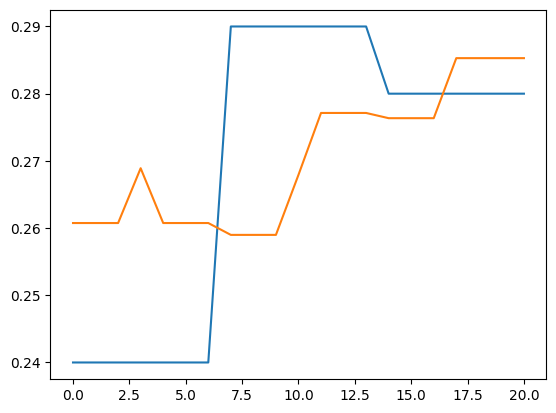

In [97]:
plt.plot(y_val)
plt.plot(val_preds)

In [81]:
extracted_features2.head()

,vib_table__variance_larger_than_standard_deviation,vib_table__has_duplicate_max,vib_table__has_duplicate_min,vib_table__has_duplicate,vib_table__sum_values,vib_table__abs_energy,vib_table__mean_abs_change,vib_table__mean_change,vib_table__mean_second_derivative_central,vib_table__median,vib_table__mean,vib_table__length,vib_table__standard_deviation,vib_table__variation_coefficient,vib_table__variance,vib_table__skewness,vib_table__kurtosis,vib_table__root_mean_square,vib_table__absolute_sum_of_changes,vib_table__longest_strike_below_mean,vib_table__longest_strike_above_mean,vib_table__count_above_mean,vib_table__count_below_mean,vib_table__last_location_of_maximum,vib_table__first_location_of_maximum,vib_table__last_location_of_minimum,vib_table__first_location_of_minimum,vib_table__percentage_of_reoccurring_values_to_all_values,vib_table__percentage_of_reoccurring_datapoints_to_all_datapoints,vib_table__sum_of_reoccurring_values,vib_table__sum_of_reoccurring_data_points,vib_table__ratio_value_number_to_time_series_length,vib_table__sample_entropy,vib_table__maximum,vib_table__absolute_maximum,vib_table__minimum,vib_table__benford_correlation,vib_table__time_reversal_asymmetry_statistic__lag_1,vib_table__time_reversal_asymmetry_statistic__lag_2,vib_table__time_reversal_asymmetry_statistic__lag_3,vib_table__c3__lag_1,vib_table__c3__lag_2,vib_table__c3__lag_3,vib_table__cid_ce__normalize_True,vib_table__cid_ce__normalize_False,vib_table__symmetry_looking__r_0.0,vib_table__symmetry_looking__r_0.05,vib_table__symmetry_looking__r_0.1,vib_table__symmetry_looking__r_0.15000000000000002,vib_table__symmetry_looking__r_0.2,vib_table__symmetry_looking__r_0.25,vib_table__symmetry_looking__r_0.30000000000000004,vib_table__symmetry_looking__r_0.35000000000000003,vib_table__symmetry_looking__r_0.4,vib_table__symmetry_looking__r_0.45,vib_table__symmetry_looking__r_0.5,vib_table__symmetry_looking__r_0.55,vib_table__symmetry_looking__r_0.6000000000000001,vib_table__symmetry_looking__r_0.65,vib_table__symmetry_looking__r_0.7000000000000001,vib_table__symmetry_looking__r_0.75,vib_table__symmetry_looking__r_0.8,vib_table__symmetry_looking__r_0.8500000000000001,vib_table__symmetry_looking__r_0.9,vib_table__symmetry_looking__r_0.9500000000000001,vib_table__large_standard_deviation__r_0.05,vib_table__large_standard_deviation__r_0.1,vib_table__large_standard_deviation__r_0.15000000000000002,vib_table__large_standard_deviation__r_0.2,vib_table__large_standard_deviation__r_0.25,vib_table__large_standard_deviation__r_0.30000000000000004,vib_table__large_standard_deviation__r_0.35000000000000003,vib_table__large_standard_deviation__r_0.4,vib_table__large_standard_deviation__r_0.45,vib_table__large_standard_deviation__r_0.5,vib_table__large_standard_deviation__r_0.55,vib_table__large_standard_deviation__r_0.6000000000000001,vib_table__large_standard_deviation__r_0.65,vib_table__large_standard_deviation__r_0.7000000000000001,vib_table__large_standard_deviation__r_0.75,vib_table__large_standard_deviation__r_0.8,vib_table__large_standard_deviation__r_0.8500000000000001,vib_table__large_standard_deviation__r_0.9,vib_table__large_standard_deviation__r_0.9500000000000001,vib_table__quantile__q_0.1,vib_table__quantile__q_0.2,vib_table__quantile__q_0.3,vib_table__quantile__q_0.4,vib_table__quantile__q_0.6,vib_table__quantile__q_0.7,vib_table__quantile__q_0.8,vib_table__quantile__q_0.9,vib_table__autocorrelation__lag_0,vib_table__autocorrelation__lag_1,vib_table__autocorrelation__lag_2,vib_table__autocorrelation__lag_3,vib_table__autocorrelation__lag_4,vib_table__autocorrelation__lag_5,vib_table__autocorrelation__lag_6,vib_table__autocorrelation__lag_7,vib_table__autocorrelation__lag_8,vib_table__autocorrelation__lag_9,"vib_table__agg_autocorrelation__f_agg_""mean""__maxlag_40","vib_table__agg_autocorrelation__f_agg_""median""__maxlag_40","vib_table__agg_autocorrelation__f_agg_""var""__maxlag_40",vib_table__partial_autocorrelation__lag_0,vib_table__partial_autoco

In [83]:
test_preds = lgb_first.predict(extracted_features2)

In [87]:
output = pd.DataFrame(list(zip(c9_y, test_preds)))
output.columns = ['test', 'pred']
# we dont have segment id here but since the label (time to eruption) for six rows will be the same, we groupby val
output = output.groupby('test').mean().reset_index()
print('Simple LGB model rmse: ', sqrt(mse(output['test'].to_numpy(), output['pred'].to_numpy())))
print('Simple LGB model mae: ', mae(output['test'].to_numpy(), output['pred'].to_numpy()))

Simple LGB model rmse:  0.26852035091614374
Simple LGB model mae:  0.2095299072682761


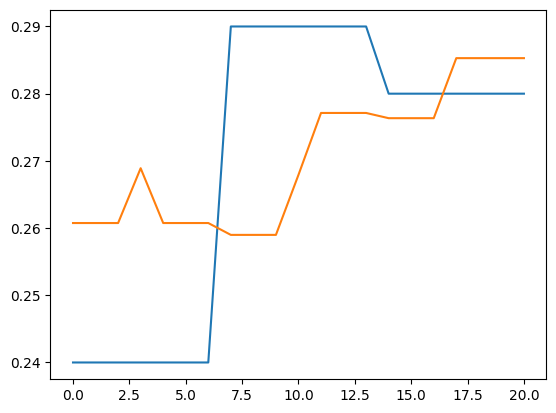

In [91]:
plt.plot(y_val)
plt.plot(val_preds)

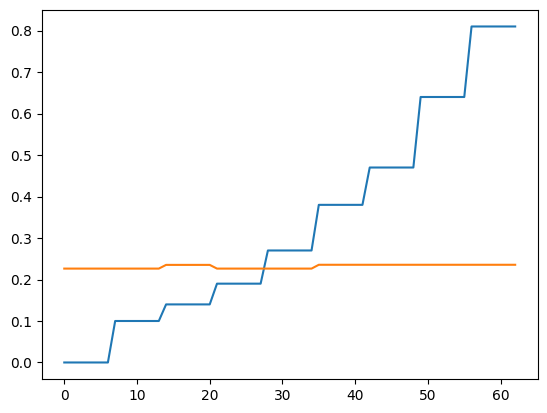

In [89]:
plt.plot(c9_y)
plt.plot(test_preds)

In [ ]:
lgb_first.predict(x_val)

In [ ]:
output = pd.DataFrame(list(zip(y_val, val_preds)))
output.columns = ['val', 'pred']
# we dont have segment id here but since the label (time to eruption) for six rows will be the same, we groupby val
output = output.groupby('val').mean().reset_index()
print('Simple LGB model rmse: ', sqrt(mse(output['val'].to_numpy(), output['pred'].to_numpy())))
print('Simple LGB model mae: ', mae(output['val'].to_numpy(), output['pred'].to_numpy()))

In [37]:
save_columns

Index(['vib_table__variance_larger_than_standard_deviation',
       'vib_table__has_duplicate_max', 'vib_table__has_duplicate_min',
       'vib_table__has_duplicate', 'vib_table__sum_values',
       'vib_table__abs_energy', 'vib_table__mean_abs_change',
       'vib_table__mean_change', 'vib_table__mean_second_derivative_central',
       'vib_table__median',
       ...
       'smcDC__fourier_entropy__bins_5', 'smcDC__fourier_entropy__bins_10',
       'smcDC__fourier_entropy__bins_100',
       'smcDC__permutation_entropy__dimension_3__tau_1',
       'smcDC__permutation_entropy__dimension_4__tau_1',
       'smcDC__permutation_entropy__dimension_5__tau_1',
       'smcDC__permutation_entropy__dimension_6__tau_1',
       'smcDC__permutation_entropy__dimension_7__tau_1',
       'smcDC__query_similarity_count__query_None__threshold_0.0',
       'smcDC__mean_n_absolute_max__number_of_maxima_7'],
      dtype='object', length=4698)

In [38]:
save_columns[12], save_columns[16], save_columns[17], save_columns[97], save_columns[254]

('vib_table__standard_deviation',
 'vib_table__kurtosis',
 'vib_table__root_mean_square',
 'vib_table__autocorrelation__lag_5',
 'vib_table__change_quantiles__f_agg_"var"__isabs_False__qh_0.8__ql_0.6')

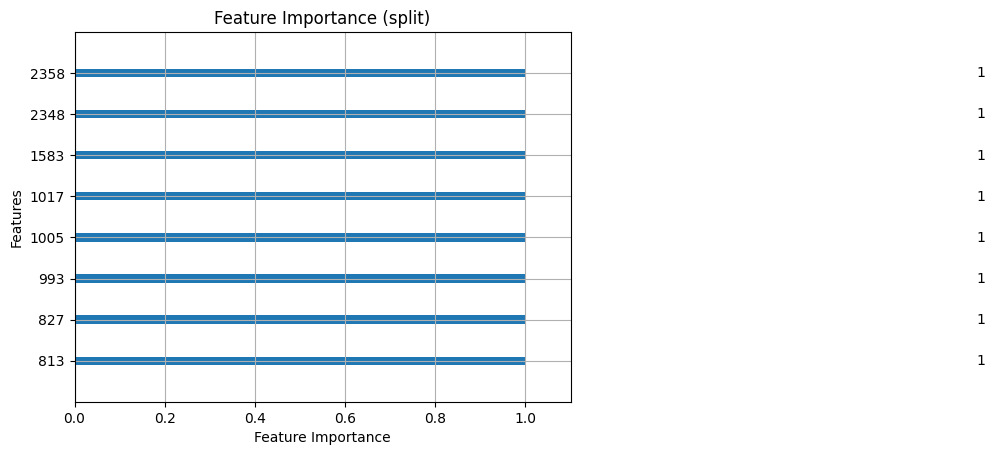

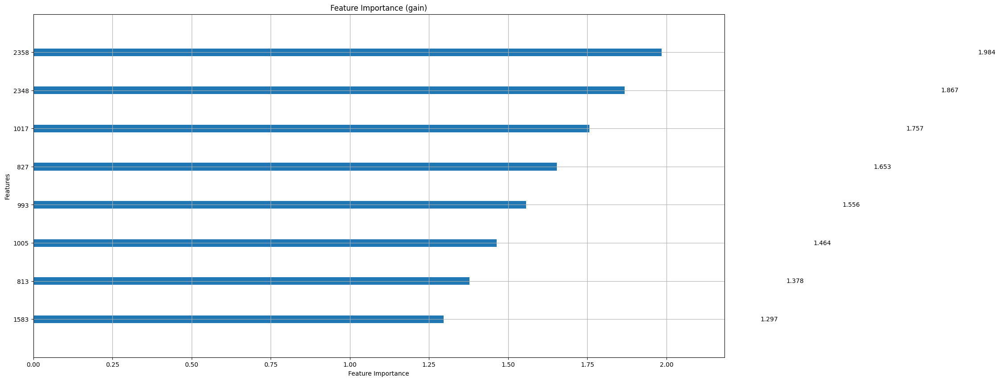

In [39]:

ax = lightgbm.plot_importance(lgb_first, max_num_features=None, importance_type='split')
ax.set(title=f'Feature Importance (split)',
	xlabel='Feature Importance',
	ylabel='Features')
ax.figure.savefig(f'./fi_split.png', dpi=300)


# GAIN
ax = lightgbm.plot_importance(lgb_first, max_num_features=None, importance_type='gain',figsize=(20,10))
ax.set(title=f'Feature Importance (gain)',
	xlabel='Feature Importance',
	ylabel='Features')
ax.figure.savefig(f'./fi_gain.png', dpi=300)

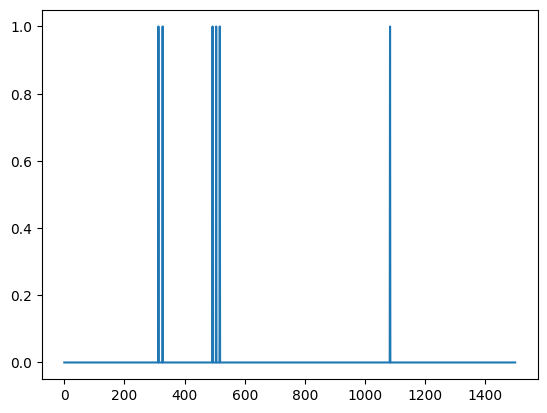

In [50]:
plt.plot(lgb_first.feature_importances_[500:2000])

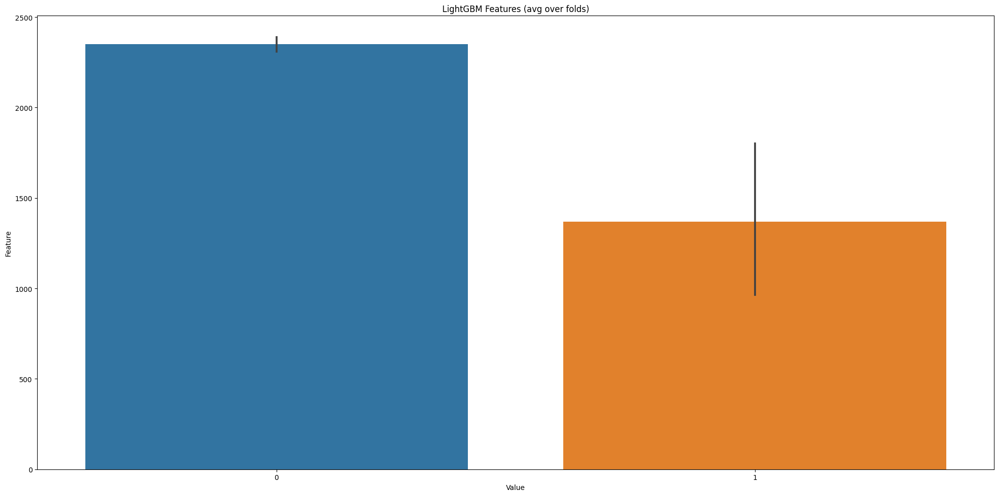

<Figure size 640x480 with 0 Axes>

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp = pd.DataFrame(sorted(zip(lgb_first.feature_importances_,extracted_features.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()
plt.savefig('lgbm_importances-01.png')

In [ ]:
test_preds = lgb_first.predict(x_test)
test_first_preds_df = pd.DataFrame(list(zip(seg_id_test, test_preds)))
test_first_preds_df.columns = ['segment_id', 'time_to_eruption']
test_first_preds_df = test_first_preds_df.groupby('segment_id').mean().reset_index()

In [39]:
extracted_features.columns

Index(['smcAC__variance_larger_than_standard_deviation',
       'smcAC__has_duplicate_max', 'smcAC__has_duplicate_min',
       'smcAC__has_duplicate', 'smcAC__sum_values', 'smcAC__abs_energy',
       'smcAC__mean_abs_change', 'smcAC__mean_change',
       'smcAC__mean_second_derivative_central', 'smcAC__median',
       ...
       'value__fourier_entropy__bins_5', 'value__fourier_entropy__bins_10',
       'value__fourier_entropy__bins_100',
       'value__permutation_entropy__dimension_3__tau_1',
       'value__permutation_entropy__dimension_4__tau_1',
       'value__permutation_entropy__dimension_5__tau_1',
       'value__permutation_entropy__dimension_6__tau_1',
       'value__permutation_entropy__dimension_7__tau_1',
       'value__query_similarity_count__query_None__threshold_0.0',
       'value__mean_n_absolute_max__number_of_maxima_7'],
      dtype='object', length=5481)

In [ ]:
# fictions function to get top features from your dataset
top_features_column_names = extracted_features.get_top_features()
# get the config for the selected columns
config = from_columns(top_features_column_names)
# get selected features for another dataframe
selected_features_df = extract_features(c9_x_t_total, column_id =   'id', kind_to_fc_parameters = config)

AttributeError: 'DataFrame' object has no attribute 'get_top_features'

In [70]:
c1_y_lab=[]
for i in range(15):
    c1_y_lab.append([i]*7)
c1_y_lab=np.array(c1_y_lab).reshape(-1)

In [72]:
relevance_table= calculate_relevance_table(extracted_features, c1_y_lab)
relevance_table=relevance_table[relevance_table.relevant]
relevance_table.sort_values("p_value", inplace=True)
print(relevance_table.loc["feature"][:20])

AttributeError: 'numpy.ndarray' object has no attribute 'sort_index'

In [57]:
impute(extracted_features)
features_filtered = select_features(extracted_features, c1_y)

In [58]:
features_filtered

,"smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.4","smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.0","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.4","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.4",smcAC__cid_ce__normalize_False,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.0","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.0","smcAC__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""min""","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.0",smcAC__mean_abs_change,smcAC__absolute_sum_of_changes,"smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.4",smcAC__benford_correlation,"smcAC__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""max""","smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.2","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.0","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.4",smcAC__quantile__q_0.7,smcAC__quantile__q_0.9,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.0","smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.6","smcAC__agg_linear_trend__attr_""intercept""__chunk_len_5__f_agg_""var""",smcAC__mean_n_absolute_max__number_of_maxima_7,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.2","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.4","smcAC__agg_linear_trend__attr_""intercept""__chunk_len_50__f_agg_""var""","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.6","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.0",smcAC__quantile__q_0.8,"smcAC__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""var""","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.2",smcAC__autocorrelation__lag_4,"smcAC__agg_linear_trend__attr_""stderr""__chunk_len_10__f_agg_""var""","smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.2","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.6",smcAC__autocorrelation__lag_5,smcAC__abs_energy,smcAC__standard_deviation,smcAC__variance,"smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_0.8__ql_0.0","smcAC__linear_trend__attr_""stderr""",smcAC__root_mean_square,"smcAC__agg_linear_trend__attr_""stderr""__chunk_len_5__f_agg_""mean""",smcAC__autocorrelation__lag_6,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.2","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.2",smcAC__autocorrelation__lag_2,"smcAC__change_quantiles__f_agg_""var""__isabs_True__qh_0.6__ql_0.0","smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.4",smcAC__autocorrelation__lag_7,smcAC__number_crossing_m__m_0,"smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.2",smcAC__autocorrelation__lag_3,smcAC__quantile__q_0.1,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.4__ql_0.2","smcAC__agg_linear_trend__attr_""intercept""__chunk_len_10__f_agg_""var""",AE_table__quantile__q_0.8,smcAC__autocorrelation__lag_8,smcAC__number_crossing_m__m_1,AE_table__quantile__q_0.7,"smcAC__agg_linear_trend__attr_""stderr""__chunk_len_10__f_agg_""mean""",smcAC__number_crossing_m__m_-1,smcAC__quantile__q_0.2,"smcAC__change_quantiles__f_agg_""var""__isabs_False__qh_0.4__ql_0.0",smcAC__quantile__q_0.3,AE_table__quantile__q_0.6,AE_table__quantile__q_0.9,AE_table__c3__lag_1,smcAC__maximum,AE_table__c3__lag_2,AE_table__abs_energy,AE_table__root_mean_square,AE_table__c3__lag_3,"AE_table__fft_coefficient__attr_""real""__coeff_0",AE_table__mean,"AE_table__fft_coefficient__attr_""abs""__coeff_0",AE_table__sum_values,"smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.4__ql_0.0",AE_table__median,AE_table__quantile__q_0.4,"smcAC__change_quantiles__f_agg_""mean""__isabs_True__qh_0.4__ql_0.2",AE_table__sum_of_reoccurring_values,smcAC__quantile__q_0.6,"AE_table__agg_linear_trend__attr_""intercept""__chunk_len_5__

In [ ]:
features_filtered_direct = extract_relevant_features(timeseries, y,
                                                     column_id='id', column_sort='time')

In [24]:
c1_x_t

,index,time,value
0,0,0,-2.375488
1,0,1,-1.958008
2,0,2,-1.274414
3,0,3,-0.830078
4,0,4,-0.195312
...,...,...,...
86011,83,1019,2.985840
86012,83,1020,2.587891
86013,83,1021,1.191406
86014,83,1022,-0.290527


In [29]:
res  = pd.DataFrame()
n_ts = 20
l_ts = 1000
n_ti = 3
def tsfresh_time(sett):
    for f, param in tqdm(sett.items()):
        res.loc[f, "feature"] = f
        res.loc[f, "n_samp"] = n_ts
        res.loc[f, "length"] = l_ts

        fc_dict = {f:param}

        t = timeit.timeit(lambda : extract_features(c1_x_t, 
                         column_id='index',
                         column_sort='time',
                         column_value='value',
                         n_jobs=1, 
                         default_fc_parameters=fc_dict, 
                         disable_progressbar=True), 
                          number=n_ti)
        n_fs = 1
        res.loc[f, "n_fs"] = n_fs
        res.loc[f, "t_abs"] = t * 1.0/n_fs
        res.loc[f, "t_1ts"] = t*1.0/(n_ts*n_fs)
    return res

100%|██████████| 63/63 [02:01<00:00,  1.92s/it]


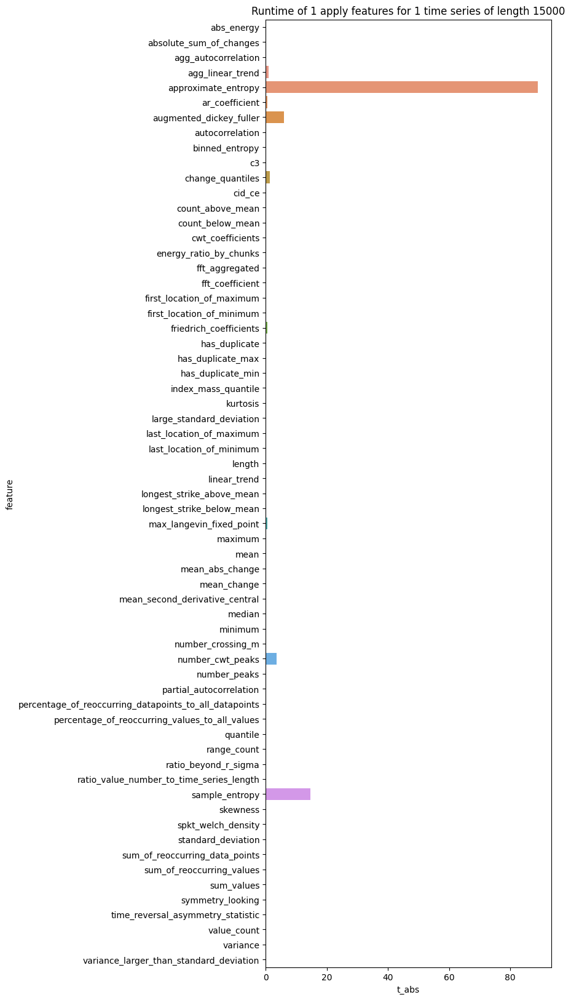

In [32]:
res=pd.DataFrame()
res=tsfresh_time(settings)
res["feature"] = res.feature.astype(str)
res = res.sort_values(by="feature")

plt.figure(figsize=(6, 20))
sns.barplot(y="feature", x="t_abs", data=res)
plt.title("Runtime of 1 apply features for 1 time series of length 15000")
plt.show()

100%|██████████| 63/63 [02:00<00:00,  1.92s/it]


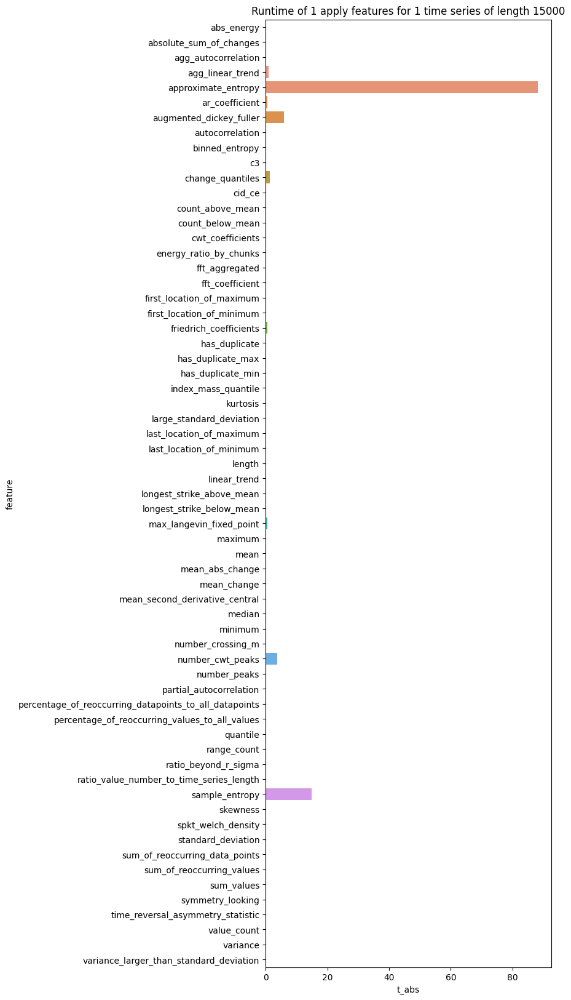

In [33]:
res=pd.DataFrame()
res=tsfresh_time(settings)
res["feature"] = res.feature.astype(str)
res = res.sort_values(by="feature")

plt.figure(figsize=(6, 20))
sns.barplot(y="feature", x="t_abs", data=res)
plt.title("Runtime of 1 apply features for 1 time series of length 15000")
plt.show()

In [25]:
c1_x_t=pd.melt(pd.DataFrame(c1_x_c), var_name='index',value_name='data')
c1_x_t

,index,data
0,0,-2.375488
1,0,-2.573242
2,0,-0.092773
3,0,2.597656
4,0,2.856445
...,...,...
86095,index,79.000000
86096,index,80.000000
86097,index,81.000000
86098,index,82.000000
